<figure>
<center>
<img src='https://www.upload.ee/image/16128913/BZU_LOGO.jpg'/>
</figure>

<center><h1></h1></center>

<center><h1>Faculty of Engineering and Technology</h1></center>

<center><h1>Electrical and Computer Engineering Department</h1></center>

---

---

<center><h1>ENCS5141 | INTELLIGENT SYSTEMS LAB</h1>

<h1>Assignment #3</h1>

---

<h3>Ali Mohammed | 1190502</h3>

<h5>Section: 1</h5></center>

# **Introduction**

In this assignment, we will explore and compare the effectiveness of the clustering algorithms we discussed in the lab - K-means, Gaussian Mixture Model (GMM), and DBSCAN - in the context of image segmentation on a set of diverse images.

# **Setups**

For each clustering algorithm we will test it on different feature spaces with/without standardization, as follows:

* RGB space without standardization.
* RGB space with standardization.
* Augmentation of RGB channels and x-y coordinates of each pixel without standardization.
* Augmentation of RGB channels and x-y coordinates of each pixel with standardization.

# **Dataset**

Evaluate the clustering algorithms using a collection of 4 to 8 RGB images depicting various scenes and objects

For me, I chose 4 RGB images with different scences and objects. The catgeories of my images are: bus, dinosaur, flower, food dish.

I choose images with small size in order to speedup the experimental time.

---

This function is used to read the images stored in a given path.

In [ ]:
import os
import cv2
from skimage import io

# Loading images from a directory
def load_images(directory):
    images = []
    image_paths = []

    for filename in os.listdir(directory):
        img_path = os.path.join(directory, filename)
        image = io.imread(img_path)
        images.append(image)
        image_paths.append(img_path)

    return images, image_paths

We read the images stored in the 'Dataset' folder.

In [ ]:
images, image_paths = load_images('Dataset/')

This code is to display the selected images.

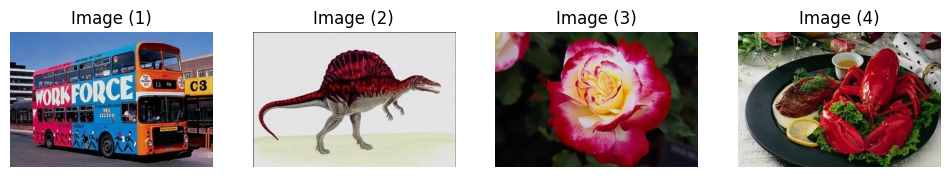

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
for i, img in enumerate(images):
  plt.subplot(1, len(images), i+1)
  plt.imshow(img)
  plt.title(f'Image ({i + 1})')
  plt.axis('off')
plt.show()

From above, these are the images we will use in our setups.

You can find the images [here](https://drive.google.com/drive/folders/1xLAtDWEpEvd1948_-0CaPKC7BCgo63DW?usp=sharing).

# **Tasks**

As mentioned before, we will use three clustering algorithms: K-means, GMM, and DBSCAN.

**Comparsion is based on**:
 * Feature space
  * RGB space.
  * RGB channels and pixel x-y coordinates.
 * Data preprocessing
  * Standardization before clustering.

**Evaluation**:
* **Qualitative assessment**: we will visualize all results using matplotlib.

* **Quantitative evaulation**: we will use the following metrics
  * Silhouette Score: The silhouette score measures the compactness and separation of clusters. It ranges from -1 to 1, where a higher score indicates better-defined clusters and a more appropriate clustering result.

  * Davies-Bouldin Index: This index quantifies the average similarity between each cluster and its most similar cluster, providing a measure of cluster separation. Lower values indicate better clustering.

  * Calinski-Harabasz Index: This index evaluates the ratio of the sum of between-cluster dispersion to the sum of within-cluster dispersion. Higher values represent better clustering results.

Standardization (or z-score normalization) is often preferred when the features in your data have different units or scales. This method transforms the data so that it has a mean of 0 and a standard deviation of 1.

Clustering models are distance-based algorithms. In order to measure similarities between observations and form clusters they use a distance metric. So, features with high ranges will have a bigger influence on the clustering. Therefore, standardization is required before building a clustering model.



## **Functions**

This is to prevent the warnings that show up while runtime to make the output clear.

In [ ]:
import warnings
warnings.filterwarnings('ignore')

Rich library is used to print the results in tables.

In [ ]:
pip install rich

These functions are used to extract the features from the images.

In [ ]:
def rgb_feature_space(input_image):
    n_pixels, n_channels = input_image.shape[0] * input_image.shape[1], input_image.shape[2]
    image_reshaped = input_image.reshape((n_pixels, n_channels))
    return image_reshaped

In [ ]:
def rgb_xy_feature_space(input_image):
    height, width, n_channels = input_image.shape

    pixel_indices = np.indices((height, width)).reshape(2, -1).T
    image_reshaped_with_indices = np.concatenate((pixel_indices, input_image.reshape(-1, n_channels)), axis=1)

    return image_reshaped_with_indices

In [ ]:
from sklearn.preprocessing import StandardScaler

def standardize_rgb_features(input_image):
    n_pixels, n_channels = input_image.shape[0] * input_image.shape[1], input_image.shape[2]
    features = input_image.reshape((n_pixels, n_channels))

    scaler = StandardScaler()
    standardized_features = scaler.fit_transform(features)
    return scaler, standardized_features

In [ ]:
from sklearn.preprocessing import StandardScaler

def standardize_rgb_xy_features(input_image):
    height, width, n_channels = input_image.shape
    n_pixels = height * width

    xx, yy = np.meshgrid(np.arange(width), np.arange(height))
    xx = xx.reshape(-1, 1)
    yy = yy.reshape(-1, 1)

    features = input_image.reshape((n_pixels, n_channels))
    features = np.hstack([features, xx, yy])

    scaler = StandardScaler()
    standardized_features = scaler.fit_transform(features)

    return scaler, standardized_features

## **K-means**

### **Implementation**

#### **RGB space**

This function is to perform K-means on RGB space and return the segmented image and the labels.

In [ ]:
def kmeans_rgb(k, rgb_img, original_img):
  kmeans = KMeans(n_clusters=k, random_state=0)
  labels = kmeans.fit_predict(rgb_img)
  segmented_image = kmeans.cluster_centers_[labels].reshape(original_img.shape)
  return segmented_image, labels

#### **Augmentation (RGB channels + x-y coordinates of the pixel)**

This function is to perform K-means on RGB channels and pixel x-y coordinates and return the segmented image and the labels.

In [ ]:
def kmeans_rgb_xy(k, rgb_xy_img, original_img):
  kmeans = KMeans(n_clusters=k, random_state=0)
  labels = kmeans.fit_predict(rgb_xy_img)
  #segmented_image = kmeans.cluster_centers_[labels][:, 2:].reshape((height, width, n_channels))
  segmented_image = kmeans.cluster_centers_[labels][:, 2:].reshape(original_img.shape)
  return segmented_image, labels

#### **Standardize RGB features**

This function is to perform K-means on standardized RGB features and return the segmented image and the labels.

In [ ]:
def kmeans_rgb_standardized(k, rgb_img_std, original_img, scaler):
  kmeans = KMeans(n_clusters=k, random_state=0)
  labels = kmeans.fit_predict(rgb_img_std)
  segmented_image = scaler.inverse_transform(kmeans.cluster_centers_[labels])[:, :3]
  segmented_image = segmented_image.reshape(original_img.shape).astype(np.uint8)
  return segmented_image, labels

#### **Standardize (RGB + x-y) features**

This function is to perform K-means on standardized RGB channels and pixel x-y coordinates features and return the segmented image and the labels.

In [ ]:
def kmeans_rgb_xy_standardized(k, rgb_xy_img_std, original_img, scaler):
  kmeans = KMeans(n_clusters=k, random_state=0)
  labels = kmeans.fit_predict(rgb_xy_img_std)
  segmented_image = scaler.inverse_transform(kmeans.cluster_centers_[labels])[:, :3]
  segmented_image = segmented_image.reshape(original_img.shape).astype(np.uint8)
  return segmented_image, labels

### **Results**

**How this code works?**

For each image, I applied all setups together and visualized them in order to make the comparsion step easier since you can notice the differences between all images at once. Moreover, for each image, I printed the evaluation metrices with different values of K.

Qualitative assessment on image 1


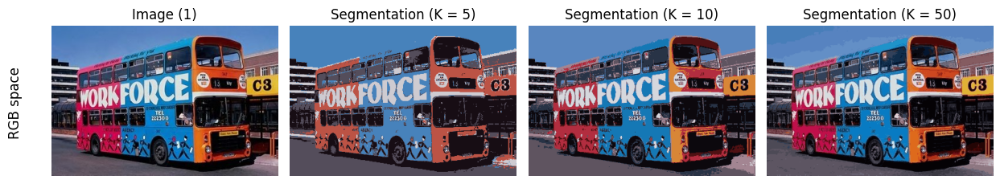

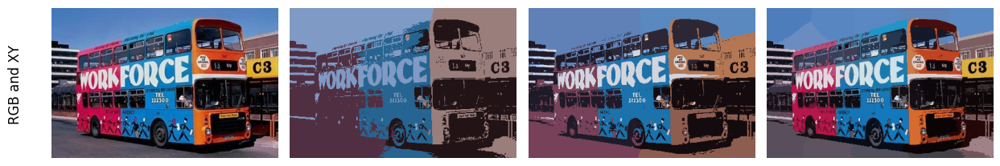

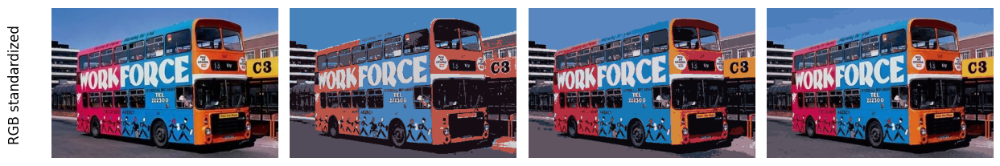

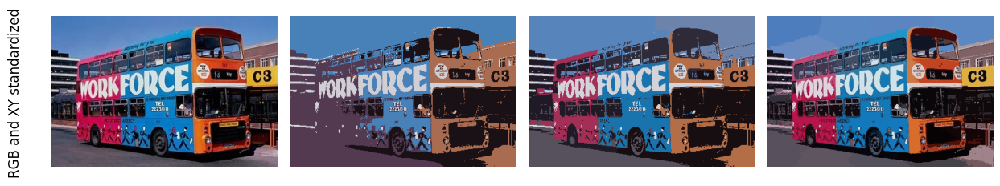

                     Qualitative assessment on Image 1                     
┏━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━━┓
┃        Scenario         ┃ K  ┃ Silhouette Score ┃ DB Index ┃  CH Index  ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━━┩
│        RGB space        │ 5  │      0.533       │  0.714   │ 151281.977 │
│        RGB space        │ 10 │      0.524       │  0.733   │ 166701.966 │
│        RGB space        │ 50 │      0.385       │  0.871   │ 135855.456 │
│       RGB and XY        │ 5  │      0.325       │  1.144   │ 46249.161  │
│       RGB and XY        │ 10 │      0.361       │  1.067   │  43956.39  │
│       RGB and XY        │ 50 │      0.335       │  1.016   │ 36024.959  │
│    RGB standardized     │ 5  │      0.526       │  0.731   │ 147133.466 │
│    RGB standardized     │ 10 │      0.524       │   0.73   │ 164883.489 │
│    RGB standardized     │ 50 │      0.386       │  0.882   │ 135227.239 │
│ RGB and XY standardized │ 5  │      0.346       │  1.052   │  45252.48  │
│ RGB and XY standardized │ 10 │      0.387       │  0.929   │ 46425.712  │
│ RGB and XY standardized │ 50 │       0.33       │  1.017   │ 35984.459  │
└─────────────────────────┴────┴──────────────────┴──────────┴────────────┘



Qualitative assessment on image 2


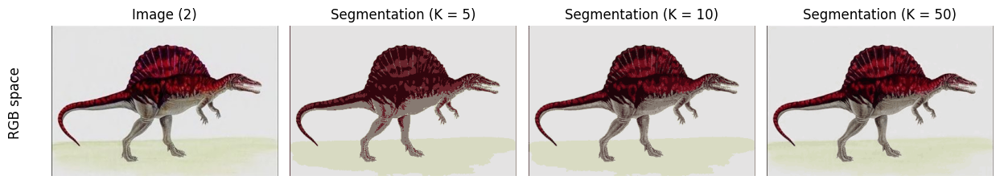

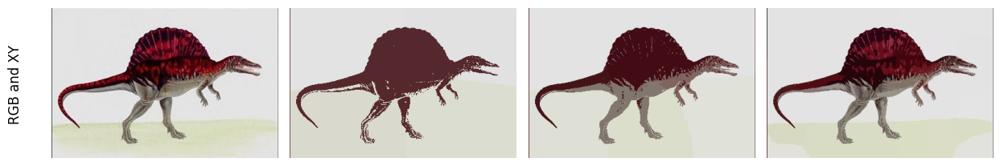

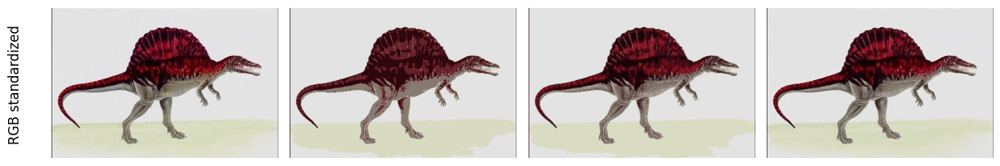

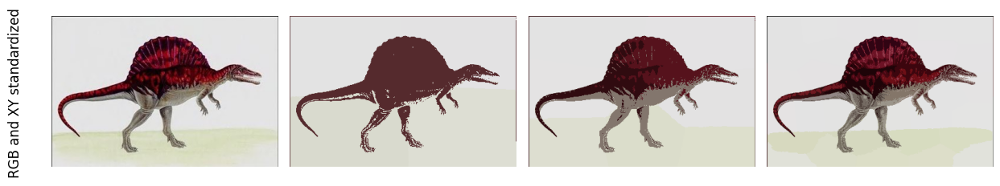

                     Qualitative assessment on Image 2                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━━━┓
┃        Scenario         ┃ K  ┃ Silhouette Score ┃ DB Index ┃  CH Index   ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━━━┩
│        RGB space        │ 5  │      0.725       │  0.595   │ 1184473.582 │
│        RGB space        │ 10 │       0.71       │  0.671   │ 1305181.892 │
│        RGB space        │ 50 │       0.48       │  0.921   │ 1000700.83  │
│       RGB and XY        │ 5  │      0.449       │  0.794   │ 108563.701  │
│       RGB and XY        │ 10 │      0.402       │  0.851   │ 102379.832  │
│       RGB and XY        │ 50 │      0.329       │  0.975   │  80296.802  │
│    RGB standardized     │ 5  │      0.721       │  0.586   │ 1107898.849 │
│    RGB standardized     │ 10 │      0.701       │  0.699   │ 1222150.176 │
│    RGB standardized     │ 50 │      0.408       │  0.945   │ 955835.232  │
│ RGB and XY standardized │ 5  │      0.475       │  0.706   │ 123507.191  │
│ RGB and XY standardized │ 10 │      0.373       │   0.94   │ 118580.816  │
│ RGB and XY standardized │ 50 │      0.332       │  0.949   │  87875.944  │
└─────────────────────────┴────┴──────────────────┴──────────┴─────────────┘



Qualitative assessment on image 3


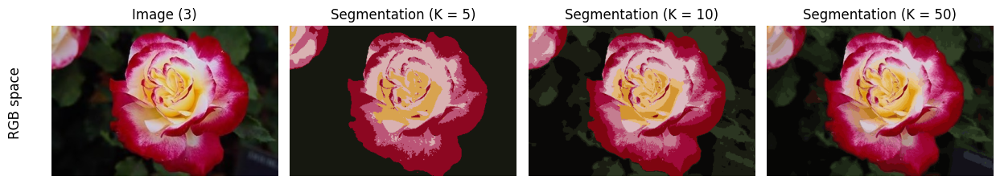

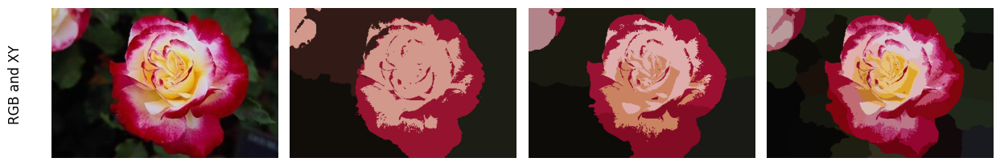

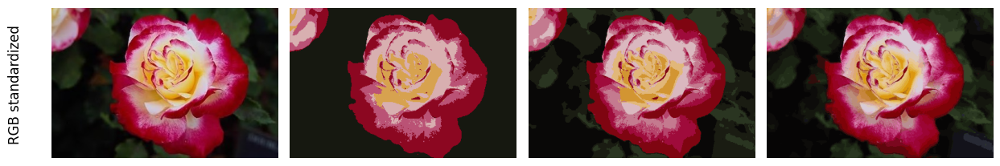

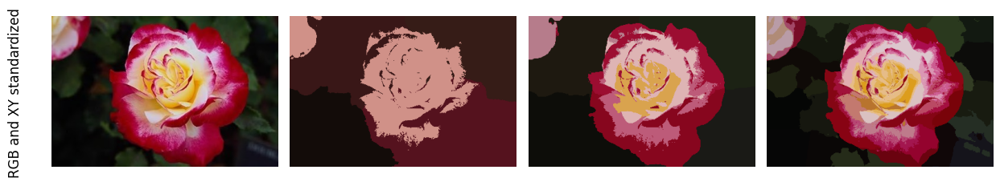

                     Qualitative assessment on Image 3                     
┏━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━━┓
┃        Scenario         ┃ K  ┃ Silhouette Score ┃ DB Index ┃  CH Index  ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━━┩
│        RGB space        │ 5  │      0.619       │  0.714   │ 290837.742 │
│        RGB space        │ 10 │      0.454       │  0.815   │ 308099.115 │
│        RGB space        │ 50 │      0.358       │  0.972   │ 217368.256 │
│       RGB and XY        │ 5  │      0.364       │  1.036   │ 66154.194  │
│       RGB and XY        │ 10 │      0.387       │  0.979   │ 66786.175  │
│       RGB and XY        │ 50 │      0.321       │  1.008   │ 53476.935  │
│    RGB standardized     │ 5  │      0.589       │   0.72   │ 253028.186 │
│    RGB standardized     │ 10 │      0.463       │  0.786   │ 277310.615 │
│    RGB standardized     │ 50 │      0.343       │  0.945   │ 206412.031 │
│ RGB and XY standardized │ 5  │       0.38       │  0.935   │ 66859.463  │
│ RGB and XY standardized │ 10 │      0.397       │  0.972   │  65827.68  │
│ RGB and XY standardized │ 50 │      0.326       │  1.014   │ 49533.864  │
└─────────────────────────┴────┴──────────────────┴──────────┴────────────┘



Qualitative assessment on image 4


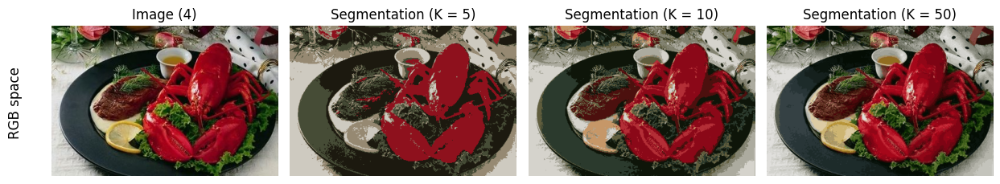

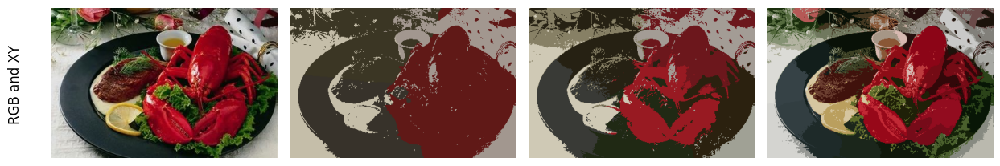

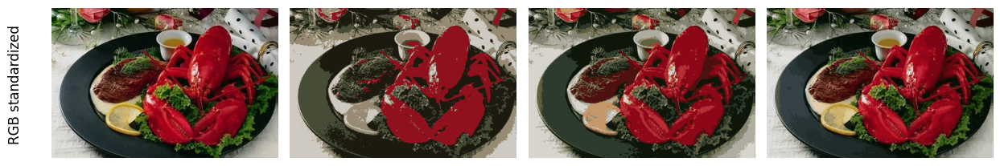

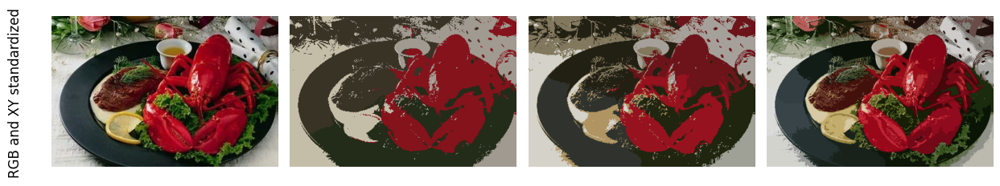

                     Qualitative assessment on Image 4                     
┏━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━━┓
┃        Scenario         ┃ K  ┃ Silhouette Score ┃ DB Index ┃  CH Index  ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━━┩
│        RGB space        │ 5  │      0.471       │  0.746   │ 213190.56  │
│        RGB space        │ 10 │      0.434       │  0.833   │ 201548.15  │
│        RGB space        │ 50 │      0.341       │  0.893   │ 167593.957 │
│       RGB and XY        │ 5  │      0.318       │  1.104   │ 49097.398  │
│       RGB and XY        │ 10 │      0.315       │  1.013   │ 44868.138  │
│       RGB and XY        │ 50 │      0.321       │  1.008   │ 35950.749  │
│    RGB standardized     │ 5  │      0.471       │  0.747   │ 214124.276 │
│    RGB standardized     │ 10 │      0.433       │  0.829   │ 201146.011 │
│    RGB standardized     │ 50 │      0.336       │  0.899   │ 166723.757 │
│ RGB and XY standardized │ 5  │      0.303       │  1.199   │ 47723.523  │
│ RGB and XY standardized │ 10 │       0.33       │   1.0    │ 45444.807  │
│ RGB and XY standardized │ 50 │      0.309       │  1.009   │ 34421.982  │
└─────────────────────────┴────┴──────────────────┴──────────┴────────────┘

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from skimage import io
from skimage.metrics import structural_similarity as ssim
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import pandas as pd
from rich.console import Console
from rich.table import Table

n_tasks = 4
silhouette_scores_avg = []
db_scores_avg = []
ch_scores_avg = []
titles = ['RGB space', 'RGB and XY', 'RGB standardized', 'RGB and XY standardized']
k_values = [5, 10, 50]

for j, image in enumerate(images):
    image_reshaped = rgb_feature_space(image)
    image_reshaped_with_indices = rgb_xy_feature_space(image)
    scaler_rgb, standardized_img_rgb = standardize_rgb_features(image)
    scaler_rgb_xy, standardized_img_rgb_xy = standardize_rgb_xy_features(image)

    height, width, n_channels = image.shape

    segmented_images = [[] for _ in range(n_tasks)]
    silhouette_scores = [[] for _ in range(n_tasks)]
    db_scores = [[] for _ in range(n_tasks)]
    ch_scores = [[] for _ in range(n_tasks)]

    print(f"Qualitative assessment on image {j + 1}")
    for k in k_values:
        segmented_image, labels = kmeans_rgb(k, image_reshaped, image)
        segmented_images[0].append(segmented_image)
        silhouette = silhouette_score(image_reshaped, labels)
        db_score = davies_bouldin_score(image_reshaped, labels)
        ch_score = calinski_harabasz_score(image_reshaped, labels)
        silhouette_scores[0].append(silhouette)
        db_scores[0].append(db_score)
        ch_scores[0].append(ch_score)

        segmented_image, labels = kmeans_rgb_xy(k, image_reshaped_with_indices, image)
        segmented_images[1].append(segmented_image)
        silhouette = silhouette_score(image_reshaped_with_indices, labels)
        db_score = davies_bouldin_score(image_reshaped_with_indices, labels)
        ch_score = calinski_harabasz_score(image_reshaped_with_indices, labels)
        silhouette_scores[1].append(silhouette)
        db_scores[1].append(db_score)
        ch_scores[1].append(ch_score)

        segmented_image, labels = kmeans_rgb_standardized(k, standardized_img_rgb, image, scaler_rgb)
        segmented_images[2].append(segmented_image)
        silhouette = silhouette_score(standardized_img_rgb, labels)
        db_score = davies_bouldin_score(standardized_img_rgb, labels)
        ch_score = calinski_harabasz_score(standardized_img_rgb, labels)
        silhouette_scores[2].append(silhouette)
        db_scores[2].append(db_score)
        ch_scores[2].append(ch_score)

        segmented_image, labels = kmeans_rgb_standardized(k, standardized_img_rgb_xy, image, scaler_rgb_xy)
        segmented_images[3].append(segmented_image)
        silhouette = silhouette_score(standardized_img_rgb_xy, labels)
        db_score = davies_bouldin_score(standardized_img_rgb_xy, labels)
        ch_score = calinski_harabasz_score(standardized_img_rgb_xy, labels)
        silhouette_scores[3].append(silhouette)
        db_scores[3].append(db_score)
        ch_scores[3].append(ch_score)

    for t in range(n_tasks):
        plt.figure(figsize=(12, 4))
        plt.subplot(1, len(k_values)+1, 1)
        plt.imshow(image)
        if t == 0:
            plt.title(f'Image ({j + 1})')
        plt.axis('off')
        pos = plt.gca().get_position()
        plt.figtext(pos.x0 - 0.15, pos.y0 + pos.height / 2, titles[t],
                ha='center', va='center', rotation=90, fontsize=12)

        for i, k in enumerate(k_values):
            plt.subplot(1, len(k_values)+1, i + 2)
            plt.imshow(segmented_images[t][i].astype(np.uint8))
            if t == 0:
                plt.title(f'Segmentation (K = {k})')
            plt.axis('off')
        plt.tight_layout()
        plt.show()

    print("\n")
    all_titles = [item for item in titles for _ in range(3)]
    silhouette_scores_list = np.array(silhouette_scores).flatten().tolist()
    db_scores_list = np.array(db_scores).flatten().tolist()
    ch_scores_list = np.array(ch_scores).flatten().tolist()

    silhouette_scores_avg.append(silhouette_scores_list)
    db_scores_avg.append(db_scores_list)
    ch_scores_avg.append(ch_scores_list)

    formatted_silhouette = [round(num, 3) for num in silhouette_scores_list]
    formatted_db = [round(num, 3) for num in db_scores_list]
    formatted_ch = [round(num, 3) for num in ch_scores_list]

    data = {
        "Scenario": all_titles,
        "K": k_values * n_tasks,
        "Silhouette Score": formatted_silhouette,
        "DB Index": formatted_db,
        "CH Index": formatted_ch
    }

    df = pd.DataFrame(data)
    title = str("Qualitative assessment on Image ") + str(j + 1)
    table = Table(title=title)
    table.add_column("Scenario", justify="center")
    table.add_column("K", justify="center")
    table.add_column("Silhouette Score", justify="center")
    table.add_column("DB Index", justify="center")
    table.add_column("CH Index", justify="center")

    # Add rows to the table from the DataFrame
    for _, row in df.iterrows():
        table.add_row(
            row["Scenario"],
            str(row["K"]),
            str(row["Silhouette Score"]),
            str(row["DB Index"]),
            str(row["CH Index"]),
        )

    # Print the table using rich Console
    console = Console()
    console.print(table)

    print('\n')

#### **Results summarization code**

In [ ]:
all_titles = [item for item in titles for _ in range(3)]

silhouette_avg = np.mean(silhouette_scores_avg, axis=0)
db_avg = np.mean(db_scores_avg, axis=0)
ch_avg = np.mean(ch_scores_avg, axis=0)

formatted_silhouette = [round(num, 3) for num in silhouette_avg]
formatted_db = [round(num, 3) for num in db_avg]
formatted_ch = [round(num, 3) for num in ch_avg]

data = {
    "Scenario": all_titles,
    "K": k_values * n_tasks,
    "Silhouette Score": formatted_silhouette,
    "DB Index": formatted_db,
    "CH Index": formatted_ch
}

df = pd.DataFrame(data)
table = Table(title="K-means results summary")
table.add_column("Scenario", justify="center")
table.add_column("K", justify="center")
table.add_column("Silhouette Score", justify="center")
table.add_column("DB Index", justify="center")
table.add_column("CH Index", justify="center")

# Add rows to the table from the DataFrame
for _, row in df.iterrows():
    table.add_row(
        row["Scenario"],
        str(row["K"]),
        str(row["Silhouette Score"]),
        str(row["DB Index"]),
        str(row["CH Index"]),
    )

    # Print the table using rich Console


#### **K-means summary and analysis**

In [ ]:
console = Console()
console.print(table)

print('\n')

                          K-means results summary                          
┏━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━━┓
┃        Scenario         ┃ K  ┃ Silhouette Score ┃ DB Index ┃  CH Index  ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━━┩
│        RGB space        │ 5  │      0.587       │  0.692   │ 459945.965 │
│        RGB space        │ 10 │       0.53       │  0.763   │ 495382.781 │
│        RGB space        │ 50 │      0.391       │  0.914   │ 380379.625 │
│       RGB and XY        │ 5  │      0.364       │   1.02   │ 67516.114  │
│       RGB and XY        │ 10 │      0.366       │  0.978   │ 64497.634  │
│       RGB and XY        │ 50 │      0.327       │  1.002   │ 51437.361  │
│    RGB standardized     │ 5  │      0.577       │  0.696   │ 430546.195 │
│    RGB standardized     │ 10 │       0.53       │  0.761   │ 466372.573 │
│    RGB standardized     │ 50 │      0.368       │  0.918   │ 366049.565 │
│ RGB and XY standardized │ 5  │      0.376       │  0.973   │ 70835.664  │
│ RGB and XY standardized │ 10 │      0.372       │   0.96   │ 69069.754  │
│ RGB and XY standardized │ 50 │      0.324       │  0.997   │ 51954.062  │
└─────────────────────────┴────┴──────────────────┴──────────┴────────────┘

The following comparsion is based on features. When I say RGB, then I mean RGB space, also RGB + XY, it is about RGB channels and pixel x-y coordinates. I will use these shortcuts to things easier.

**Qualitative analysis**:
 * **RGB vs. RGB + XY**: For small values of K [5, 10], RGB is capable of getting some of original colors. While RGB + XY, fails to get back the original colors. At K=10, we notice that RGB got many colors of the original image, but RGB + XY didn't.

 * **RGB vs. Standardized RGB**: Standardization on RGB features are useless, there no difference between both.

 * **RGB + XY vs. Standardized RGB + XY**: For RGB + XY features, there is a noticable change when standardization is performed before segmentation. For K = [5, 10], we notice that the segmented image is more related to the original image than before.

**What do we notice?**
* In our case and depending on the chosen images, RGB features are better in segmenting images.
* Standardization is useless when using RGB space only, **why?** RGB channels have the same scale, so their contribution to distance will have the same weight.
* When adding spital features (x-y coordinates) to the RGB space, here we will face the problem of different scaling between the features, this will result in giving features different weights when calculating the distance. So, standardization is required to scale the features in order to make them equally contribute to the distance measurement.
* Increasing the value of K results in better segmentation, but requires more time.

---

**Quantitative analysis**: it is noticeable that the model was evaluated on each image seperately, but to make it consistent, we calculated the average of four results in the summary table above.
 * Silhouette Score
  * RGB, Standardized RGB: the score decreases as K increases.
  * RGB + XY: the scores increases for some point, then decreases as K increases.
  * Standardized RGB + XY: the score decreases as K increases.

 * Davies-Bouldin Index
  * RGB, Standardized RGB: the score increases as K increases.
  * RGB + XY, Standardized RGB + XY: the scores decreases for some point, then increases as K increases.

 * Calinski-Harabasz Index
  * RGB, Standardized RGB: the scores increases for some point, then decreases as K increases.
  * RGB + XY, Standardized RGB + XY: the score decreases as K increases.

If we depend on the quantitative results, then the best segmentation is when K=5, but visually it is not. But, **what do these results mean?**

* K-means is sensitive to the shape and size of clusters. For complex or overlapping structures in the data, a higher number of clusters (K) might be necessary to capture the nuances and details.
* Choosing K=5 might oversimplify the segmentation, merging together regions that should be distinct.
* K=50 allows for a more fine-grained segmentation, accommodating the diversity within the data. Each cluster can capture a smaller, more localized pattern or feature.
* The quantitative metrics (Silhouette Score, Davies-Bouldin Index, Calinski-Harabasz Index) provide valuable insights, but they may not capture all aspects of the visual content.

So, increasing K leads to increasing the number of clusters within the image. However, the image is full of details, so for K=50 the number of clusters may be high and that affects the quantitative measures.

---



## **GMM**

### **Implementation**

#### **RGB space**

In [ ]:
def gmm_rgb(k, rgb_img, original_img):
  gmm = GaussianMixture(n_components=k, random_state=0)
  labels = gmm.fit_predict(rgb_img)
  segmented_image = gmm.means_[labels].reshape(original_img.shape).astype(np.uint8)
  return segmented_image, labels

#### **Augmentation (RGB channels + x-y coordinates of the pixel)**

In [ ]:
def gmm_rgb_xy(k, rgb_xy_img, original_img):
  gmm = GaussianMixture(n_components=k, random_state=0)
  labels = gmm.fit_predict(rgb_xy_img)
  segmented_image = gmm.means_[labels][:, 2:].reshape(original_img.shape).astype(np.uint8)
  return segmented_image, labels

#### **Standardize RGB features**

In [ ]:
def gmm_rgb_standardized(k, rgb_img_std, original_img, scaler):
  gmm = GaussianMixture(n_components=k, random_state=0)
  labels = gmm.fit_predict(rgb_img_std)
  segmented_image = scaler.inverse_transform(gmm.means_[labels])[:, :3]
  segmented_image = segmented_image.reshape(original_img.shape).astype(np.uint8)
  return segmented_image, labels

#### **Standardize (RGB + x-y) features**

In [ ]:
def gmm_rgb_xy_standardized(k, rgb_xy_img_std, original_img, scaler):
  gmm = GaussianMixture(n_components=k, random_state=0)
  labels = gmm.fit_predict(rgb_xy_img_std)
  segmented_image = scaler.inverse_transform(gmm.means_[labels])[:, :3]
  segmented_image = segmented_image.reshape(original_img.shape).astype(np.uint8)
  return segmented_image, labels

### **Results**

Qualitative assessment on image 1


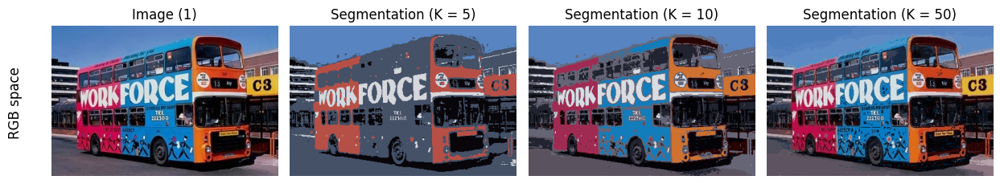

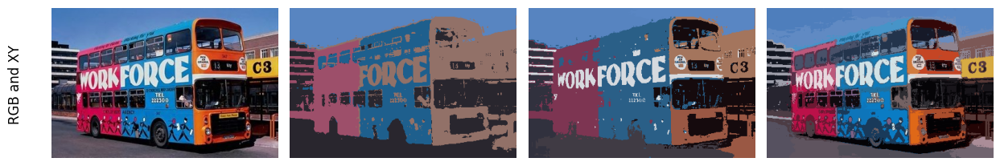

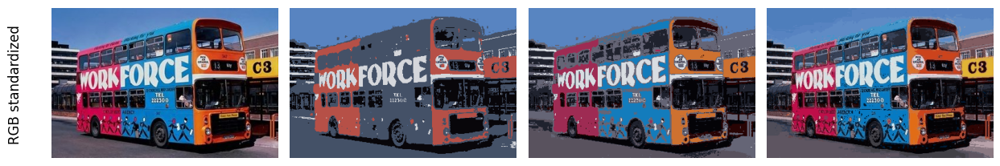

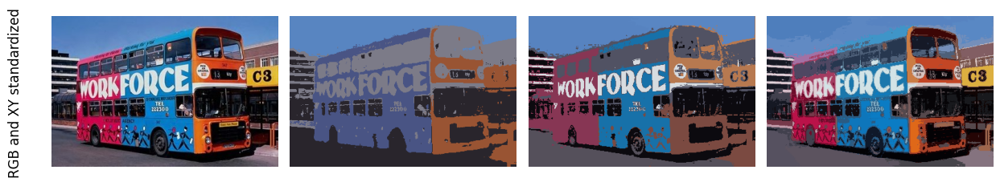

                    Qualitative assessment on Image 1                     
┏━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┓
┃        Scenario         ┃ K  ┃ Silhouette Score ┃ DB Index ┃ CH Index  ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━┩
│        RGB space        │ 5  │      0.271       │  0.868   │  53478.7  │
│        RGB space        │ 10 │      0.274       │  1.293   │ 50341.454 │
│        RGB space        │ 50 │      0.131       │  1.564   │ 36602.746 │
│       RGB and XY        │ 5  │       0.14       │  1.636   │ 17082.81  │
│       RGB and XY        │ 10 │      0.246       │  1.288   │ 28972.652 │
│       RGB and XY        │ 50 │      0.146       │  1.549   │ 16815.266 │
│    RGB standardized     │ 5  │      0.266       │  0.881   │ 53514.829 │
│    RGB standardized     │ 10 │      0.274       │   1.3    │ 49762.99  │
│    RGB standardized     │ 50 │      0.173       │  1.372   │ 48876.307 │
│ RGB and XY standardized │ 5  │      0.136       │  2.318   │ 17167.096 │
│ RGB and XY standardized │ 10 │       0.25       │  1.291   │ 24268.728 │
│ RGB and XY standardized │ 50 │      0.176       │  1.471   │ 18128.642 │
└─────────────────────────┴────┴──────────────────┴──────────┴───────────┘



Qualitative assessment on image 2


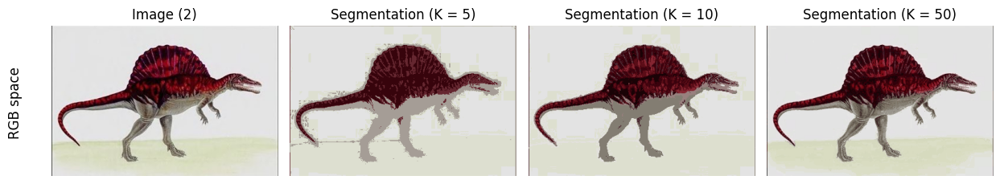

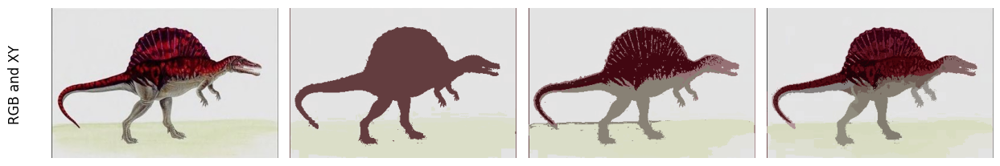

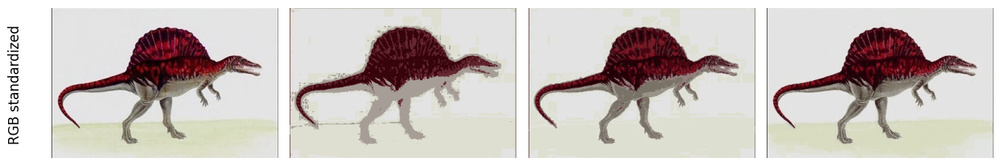

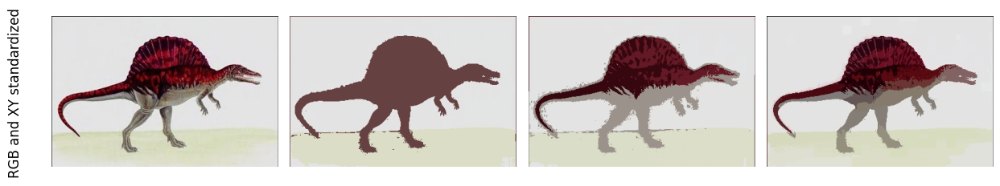

                     Qualitative assessment on Image 2                     
┏━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━━┓
┃        Scenario         ┃ K  ┃ Silhouette Score ┃ DB Index ┃  CH Index  ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━━┩
│        RGB space        │ 5  │       0.38       │  0.936   │ 229192.46  │
│        RGB space        │ 10 │       0.37       │  2.046   │ 262579.55  │
│        RGB space        │ 50 │      0.191       │  2.419   │ 352273.533 │
│       RGB and XY        │ 5  │      0.077       │  11.16   │ 22039.193  │
│       RGB and XY        │ 10 │      0.074       │  3.635   │ 20568.137  │
│       RGB and XY        │ 50 │      -0.189      │  2.629   │ 11539.353  │
│    RGB standardized     │ 5  │       0.36       │  0.954   │ 214339.791 │
│    RGB standardized     │ 10 │      0.365       │  2.351   │ 276707.175 │
│    RGB standardized     │ 50 │      0.216       │  1.867   │ 343616.553 │
│ RGB and XY standardized │ 5  │      0.237       │  2.007   │ 47072.597  │
│ RGB and XY standardized │ 10 │      0.006       │  1.902   │ 30914.092  │
│ RGB and XY standardized │ 50 │      -0.066      │  2.444   │  19615.05  │
└─────────────────────────┴────┴──────────────────┴──────────┴────────────┘



Qualitative assessment on image 3


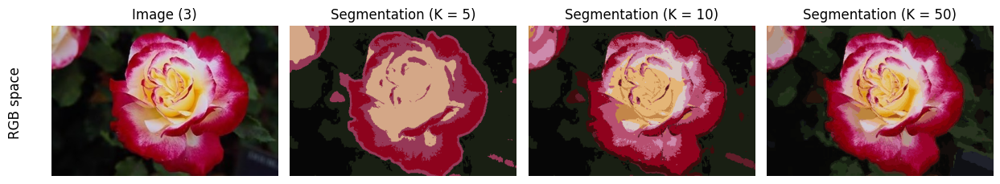

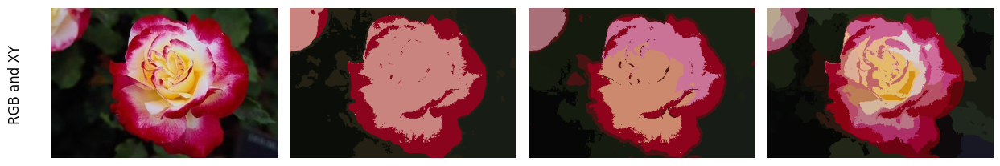

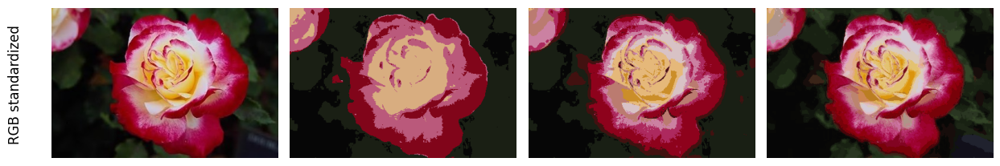

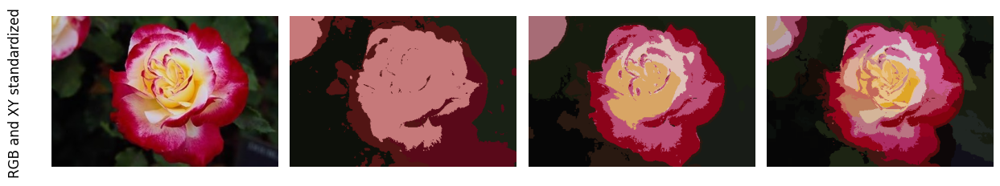

                     Qualitative assessment on Image 3                     
┏━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━━┓
┃        Scenario         ┃ K  ┃ Silhouette Score ┃ DB Index ┃  CH Index  ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━━┩
│        RGB space        │ 5  │      0.293       │  1.027   │ 118802.879 │
│        RGB space        │ 10 │      0.252       │  1.211   │ 132572.698 │
│        RGB space        │ 50 │       0.13       │  1.426   │ 113816.51  │
│       RGB and XY        │ 5  │      0.274       │  1.541   │ 44481.545  │
│       RGB and XY        │ 10 │      0.253       │  1.704   │ 39323.433  │
│       RGB and XY        │ 50 │      0.147       │  1.431   │ 25733.521  │
│    RGB standardized     │ 5  │      0.296       │  0.949   │ 130763.476 │
│    RGB standardized     │ 10 │      0.263       │  1.037   │ 137838.206 │
│    RGB standardized     │ 50 │      0.147       │  1.422   │ 117073.94  │
│ RGB and XY standardized │ 5  │       0.26       │   1.51   │ 41750.442  │
│ RGB and XY standardized │ 10 │      0.248       │   1.32   │ 38459.121  │
│ RGB and XY standardized │ 50 │       0.12       │  1.591   │  19831.3   │
└─────────────────────────┴────┴──────────────────┴──────────┴────────────┘



Qualitative assessment on image 4


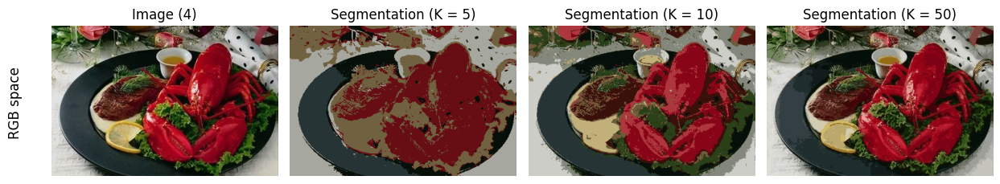

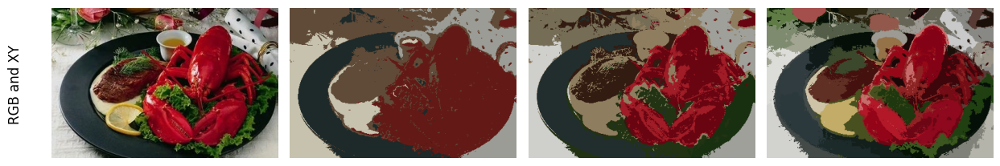

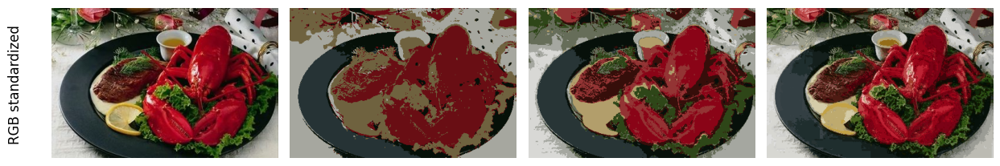

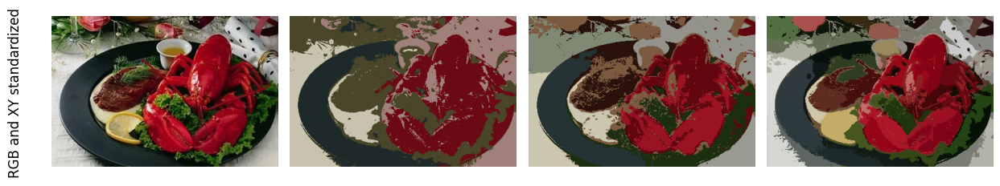

                    Qualitative assessment on Image 4                     
┏━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┓
┃        Scenario         ┃ K  ┃ Silhouette Score ┃ DB Index ┃ CH Index  ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━┩
│        RGB space        │ 5  │      0.153       │   1.14   │ 43432.874 │
│        RGB space        │ 10 │      0.221       │  1.288   │ 72834.214 │
│        RGB space        │ 50 │      0.101       │   1.75   │ 66361.924 │
│       RGB and XY        │ 5  │      0.242       │  1.371   │ 34493.661 │
│       RGB and XY        │ 10 │      0.133       │  1.609   │ 23769.042 │
│       RGB and XY        │ 50 │      0.148       │  1.582   │ 16381.114 │
│    RGB standardized     │ 5  │      0.161       │  1.142   │ 44287.184 │
│    RGB standardized     │ 10 │      0.169       │  1.357   │ 60281.328 │
│    RGB standardized     │ 50 │      0.036       │  2.021   │ 49140.859 │
│ RGB and XY standardized │ 5  │      0.183       │  1.804   │ 29345.095 │
│ RGB and XY standardized │ 10 │      0.172       │  1.458   │ 23557.342 │
│ RGB and XY standardized │ 50 │      0.126       │  1.609   │ 13374.294 │
└─────────────────────────┴────┴──────────────────┴──────────┴───────────┘

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
from skimage import io
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import pandas as pd
from rich.console import Console
from rich.table import Table

n_tasks = 4
silhouette_scores_avg = []
db_scores_avg = []
ch_scores_avg = []
titles = ['RGB space', 'RGB and XY', 'RGB standardized', 'RGB and XY standardized']
k_values = [5, 10, 50]

for j, image in enumerate(images):
    image_reshaped = rgb_feature_space(image)
    image_reshaped_with_indices = rgb_xy_feature_space(image)
    scaler_rgb, standardized_img_rgb = standardize_rgb_features(image)
    scaler_rgb_xy, standardized_img_rgb_xy = standardize_rgb_xy_features(image)

    height, width, n_channels = image.shape

    segmented_images = [[] for _ in range(n_tasks)]
    silhouette_scores = [[] for _ in range(n_tasks)]
    db_scores = [[] for _ in range(n_tasks)]
    ch_scores = [[] for _ in range(n_tasks)]

    print(f"Qualitative assessment on image {j + 1}")
    for k in k_values:
        segmented_image, labels = gmm_rgb(k, image_reshaped, image)
        segmented_images[0].append(segmented_image)
        silhouette = silhouette_score(image_reshaped, labels)
        db_score = davies_bouldin_score(image_reshaped, labels)
        ch_score = calinski_harabasz_score(image_reshaped, labels)
        silhouette_scores[0].append(silhouette)
        db_scores[0].append(db_score)
        ch_scores[0].append(ch_score)

        segmented_image, labels = gmm_rgb_xy(k, image_reshaped_with_indices, image)
        segmented_images[1].append(segmented_image)
        silhouette = silhouette_score(image_reshaped_with_indices, labels)
        db_score = davies_bouldin_score(image_reshaped_with_indices, labels)
        ch_score = calinski_harabasz_score(image_reshaped_with_indices, labels)
        silhouette_scores[1].append(silhouette)
        db_scores[1].append(db_score)
        ch_scores[1].append(ch_score)

        segmented_image, labels = gmm_rgb_standardized(k, standardized_img_rgb, image, scaler_rgb)
        segmented_images[2].append(segmented_image)
        silhouette = silhouette_score(standardized_img_rgb, labels)
        db_score = davies_bouldin_score(standardized_img_rgb, labels)
        ch_score = calinski_harabasz_score(standardized_img_rgb, labels)
        silhouette_scores[2].append(silhouette)
        db_scores[2].append(db_score)
        ch_scores[2].append(ch_score)

        segmented_image, labels = gmm_rgb_xy_standardized(k, standardized_img_rgb_xy, image, scaler_rgb_xy)
        segmented_images[3].append(segmented_image)
        silhouette = silhouette_score(standardized_img_rgb_xy, labels)
        db_score = davies_bouldin_score(standardized_img_rgb_xy, labels)
        ch_score = calinski_harabasz_score(standardized_img_rgb_xy, labels)
        silhouette_scores[3].append(silhouette)
        db_scores[3].append(db_score)
        ch_scores[3].append(ch_score)

    for t in range(n_tasks):
        plt.figure(figsize=(12, 4))
        plt.subplot(1, len(k_values)+1, 1)
        plt.imshow(image)
        if t == 0:
            plt.title(f'Image ({j + 1})')
        plt.axis('off')

        # Get the position of the first subplot
        pos = plt.gca().get_position()

        # Add a rotated title beside 'Image (1)' using figure coordinates
        plt.figtext(pos.x0 - 0.15, pos.y0 + pos.height / 2, titles[t],
                ha='center', va='center', rotation=90, fontsize=12)

        for i, k in enumerate(k_values):
            plt.subplot(1, len(k_values)+1, i + 2)
            plt.imshow(segmented_images[t][i].astype(np.uint8))
            if t == 0:
                plt.title(f'Segmentation (K = {k})')
            plt.axis('off')
        plt.tight_layout()
        plt.show()

    print("\n")
    all_titles = [item for item in titles for _ in range(3)]
    silhouette_scores_list = np.array(silhouette_scores).flatten().tolist()
    db_scores_list = np.array(db_scores).flatten().tolist()
    ch_scores_list = np.array(ch_scores).flatten().tolist()

    silhouette_scores_avg.append(silhouette_scores_list)
    db_scores_avg.append(db_scores_list)
    ch_scores_avg.append(ch_scores_list)

    formatted_silhouette = [round(num, 3) for num in silhouette_scores_list]
    formatted_db = [round(num, 3) for num in db_scores_list]
    formatted_ch = [round(num, 3) for num in ch_scores_list]

    data = {
        "Scenario": all_titles,
        "K": k_values * n_tasks,
        "Silhouette Score": formatted_silhouette,
        "DB Index": formatted_db,
        "CH Index": formatted_ch
    }

    df = pd.DataFrame(data)
    title = str("Qualitative assessment on Image ") + str(j + 1)
    table = Table(title=title)
    table.add_column("Scenario", justify="center")
    table.add_column("K", justify="center")
    table.add_column("Silhouette Score", justify="center")
    table.add_column("DB Index", justify="center")
    table.add_column("CH Index", justify="center")

    # Add rows to the table from the DataFrame
    for _, row in df.iterrows():
        table.add_row(
            row["Scenario"],
            str(row["K"]),
            str(row["Silhouette Score"]),
            str(row["DB Index"]),
            str(row["CH Index"])
        )


    # Print the table using rich Console
    console = Console()
    console.print(table)

    print('\n')

#### **Results summarization code**

In [ ]:
all_titles = [item for item in titles for _ in range(3)]

silhouette_avg = np.mean(silhouette_scores_avg, axis=0)
db_avg = np.mean(db_scores_avg, axis=0)
ch_avg = np.mean(ch_scores_avg, axis=0)

formatted_silhouette = [round(num, 3) for num in silhouette_avg]
formatted_db = [round(num, 3) for num in db_avg]
formatted_ch = [round(num, 3) for num in ch_avg]

data = {
    "Scenario": all_titles,
    "K": k_values * n_tasks,
    "Silhouette Score": formatted_silhouette,
    "DB Index": formatted_db,
    "CH Index": formatted_ch
}

df = pd.DataFrame(data)
table = Table(title="GMM results summary")
table.add_column("Scenario", justify="center")
table.add_column("K", justify="center")
table.add_column("Silhouette Score", justify="center")
table.add_column("DB Index", justify="center")
table.add_column("CH Index", justify="center")

# Add rows to the table from the DataFrame
for _, row in df.iterrows():
    table.add_row(
        row["Scenario"],
        str(row["K"]),
        str(row["Silhouette Score"]),
        str(row["DB Index"]),
        str(row["CH Index"]),
    )


#### **GMM summary and analysis**

In [ ]:
# Print the table using rich Console
console = Console()
console.print(table)

print('\n')

                            GMM results summary                            
┏━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━━┓
┃        Scenario         ┃ K  ┃ Silhouette Score ┃ DB Index ┃  CH Index  ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━━┩
│        RGB space        │ 5  │      0.274       │  0.993   │ 111226.728 │
│        RGB space        │ 10 │      0.279       │   1.46   │ 129581.979 │
│        RGB space        │ 50 │      0.138       │   1.79   │ 142263.678 │
│       RGB and XY        │ 5  │      0.183       │  3.927   │ 29524.302  │
│       RGB and XY        │ 10 │      0.177       │  2.059   │ 28158.316  │
│       RGB and XY        │ 50 │      0.063       │  1.798   │ 17617.313  │
│    RGB standardized     │ 5  │      0.271       │  0.981   │ 110726.32  │
│    RGB standardized     │ 10 │      0.267       │  1.511   │ 131147.425 │
│    RGB standardized     │ 50 │      0.143       │   1.67   │ 139676.915 │
│ RGB and XY standardized │ 5  │      0.204       │  1.909   │ 33833.807  │
│ RGB and XY standardized │ 10 │      0.169       │  1.493   │ 29299.821  │
│ RGB and XY standardized │ 50 │      0.089       │  1.779   │ 17737.322  │
└─────────────────────────┴────┴──────────────────┴──────────┴────────────┘

**Comment**: depending on my images & results & K values
* The performance of K-means is better than GMM, it is noticable that the segmented images are not capturing all original details. In addition, adding XY ended in worse results.
* There is a slight difference between K-means and GMM on RGB space, it is noticable when the results are zoomed in.
* However, GMM fails to recover the original image when using RGB + XY features, even for large values of K ~ 300, GMM fails to segment the image correctly, see figures below.
<figure>
<center>
<img src='https://www.upload.ee/image/16154378/image_2024-01-12_034314731.png'/>
<figcaption>RGB + XY</figcaption>
</figure>

*Note:* same analysis as before, nothing new since the previous analysis matches the currnet setup.

---

**Qualitative analysis**:
 * **RGB vs. RGB + XY**: For small values of K [5, 10], RGB is capable of getting some of original colors. While RGB + XY, fails to get back the original colors. At K=10, we notice that RGB got many colors of the original image, but RGB + XY didn't.

 * **RGB vs. Standardized RGB**: Standardization on RGB features are useless, there no difference between both.

 * **RGB + XY vs. Standardized RGB + XY**: For RGB + XY features, there is a noticable change when standardization is performed before segmentation. For K = [5, 10], we notice that the segmented image is more related to the original image than before.

**What do we notice?**
* In our case and depending on the chosen images, RGB features are better in segmenting images.
* Standardization is useless when using RGB space only, **why?** RGB channels have the same scale, so their contribution to distance will have the same weight.
* When adding spital features (x-y coordinates) to the RGB space, here we will face the problem of different scaling between the features, this will result in giving features different weights when calculating the distance. So, standardization is required to scale the features in order to make them equally contribute to the distance measurement.
* Increasing the value of K results in better segmentation, but requires more time.

---

**Quantitative analysis**: it is noticeable that the model was evaluated on each image seperately, but to make it consistent, we calculated the average of four results in the summary table above.
 * Silhouette Score
  * RGB, Standardized RGB: the score decreases as K increases.
  * RGB + XY, Standardized RGB + XY: the score decreases as K increases.

 * Davies-Bouldin Index
  * RGB, Standardized RGB: the score increases as K increases.
  * RGB + XY, Standardized RGB + XY: the scores decreases as K increases.

 * Calinski-Harabasz Index
  * RGB, Standardized RGB: the scores increases as K increases.
  * RGB + XY, Standardized RGB + XY: the score decreases as K increases.


If we depend on the quantitative results, then the best segmentation is when K=5, but visually it is not. But, **what do these results mean?**

* Quantitative metrics, while valuable, may not perfectly align with human perception.
* Higher values of K can lead to smaller, more specialized clusters, potentially capturing overlapping or subtle features that quantitative metrics may not fully account for.
* Higher values of K result in visually coherent segments that align well with natural boundaries in the image, even if quantitative metrics suggest suboptimal clustering.

---



## **DBSCAN**

### **Implementation**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from skimage import io
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import pandas as pd
from rich.console import Console
from rich.table import Table
from sklearn.preprocessing import LabelEncoder

#### **RGB space**

In [ ]:
def dbscan_rgb(eps, minPts, rgb_img, original_img):
  db = DBSCAN(eps=eps, min_samples=minPts).fit(rgb_img)
  labels = db.labels_
  clusters = len(set(labels)) - (1 if -1 in labels else 0)
  noise = list(labels).count(-1)
  segmented_image = np.zeros(original_img.shape, dtype=np.uint8)

  for cluster_id in set(labels):
    if cluster_id == -1:  # Black used for noise.
      continue
    pixels_in_cluster = rgb_img[labels == cluster_id]  # Extract pixels
    if len(pixels_in_cluster) == 0:
      continue
    color = np.mean(pixels_in_cluster, axis=0).astype(int)
    segmented_image[(labels.reshape(original_img.shape[:2]) == cluster_id)] = color

  return segmented_image, labels, clusters, noise

#### **Augmentation (RGB channels + x-y coordinates of the pixel)**

In [ ]:
def dbscan_rgb_xy(eps, minPts, rgb_xy_img, original_img):
  db = DBSCAN(eps=eps, min_samples=minPts).fit(rgb_xy_img)
  labels = db.labels_
  clusters = len(set(labels)) - (1 if -1 in labels else 0)
  noise = list(labels).count(-1)
  segmented_image = np.zeros(original_img.shape, dtype=np.uint8)

  for cluster_id in set(labels):
    if cluster_id == -1:  # Black used for noise.
      continue
    pixels_in_cluster = rgb_xy_img[labels == cluster_id][:, 2:]  # Extract RGB values
    if len(pixels_in_cluster) == 0:
      continue
    color = np.mean(pixels_in_cluster, axis=0).astype(int)
    segmented_image[(labels.reshape(original_img.shape[:2]) == cluster_id)] = color

  return segmented_image, labels, clusters, noise

#### **Standardize RGB features**

In [ ]:
def dbscan_rgb_standardized(eps, minPts, rgb_img_std, original_img, scaler):
  db = DBSCAN(eps=eps, min_samples=minPts).fit(rgb_img_std)
  labels = db.labels_
  clusters = len(set(labels)) - (1 if -1 in labels else 0)
  noise = list(labels).count(-1)
  segmented_image = np.zeros(original_img.shape, dtype=np.uint8)

  for cluster_id in set(labels):
    if cluster_id == -1:  # Black used for noise.
      continue
    pixels_in_cluster = scaler.inverse_transform(rgb_img_std[labels == cluster_id])
    if len(pixels_in_cluster) == 0:
      continue
    color = np.mean(pixels_in_cluster, axis=0).astype(int)
    segmented_image[(labels.reshape(original_img.shape[:2]) == cluster_id)] = color

  return segmented_image, labels, clusters, noise

#### **Standardize (RGB + x-y) features**

In [ ]:
def dbscan_rgb_xy_standardized(eps, minPts, rgb_xy_img_std, original_img, scaler):
  db = DBSCAN(eps=eps, min_samples=minPts).fit(rgb_xy_img_std)
  labels = db.labels_
  clusters = len(set(labels)) - (1 if -1 in labels else 0)
  noise = list(labels).count(-1)
  segmented_image = np.zeros(original_img.shape, dtype=np.uint8)

  for cluster_id in set(labels):
    if cluster_id == -1:  # Black used for noise.
      continue
    pixels_in_cluster = scaler.inverse_transform(rgb_xy_img_std[labels == cluster_id])[:, :3]
    if len(pixels_in_cluster) == 0:
      continue
    color = np.mean(pixels_in_cluster, axis=0).astype(int)
    segmented_image[(labels.reshape(original_img.shape[:2]) == cluster_id)] = color

  return segmented_image, labels, clusters, noise

### **Results**

In [ ]:
n_tasks = 4
eps_list = [
    [0.1, 1.5, 2.5, 3.5, 2.5, 3, 5, 10, 0.005, 0.01, 0.030, 0.06, 0.05, 0.06, 0.08, 0.16],
    [0.008, 1.5, 2.5, 3.5, 1.5, 3, 5, 10, 0.002, 0.01, 0.05, 0.06, 0.025, 0.05, 0.12, 0.17],
    [0.1, 1.5, 1.75, 2.0, 3, 4, 7, 10, 0.005, 0.006, 0.030, 0.05, 0.05, 0.06, 0.12, 0.14],
    [0.1, 1, 2.0, 4.0, 2, 3, 5, 9, 0.005, 0.009, 0.030, 0.060, 0.05, 0.08, 0.1, 0.15]
]
min_samples = [
    [1, 2, 3, 6, 1, 2, 3, 6, 1, 2, 3, 6, 1, 2, 3, 6],
    [1, 2, 3, 6, 1, 2, 3, 6, 1, 2, 3, 6, 1, 2, 3, 6],
    [1, 2, 3, 6, 1, 2, 3, 6, 1, 2, 3, 6, 1, 2, 3, 6],
    [1, 2, 3, 6, 1, 2, 3, 6, 1, 2, 3, 6, 1, 2, 3, 6]
]

Qualitative assessment on image 1


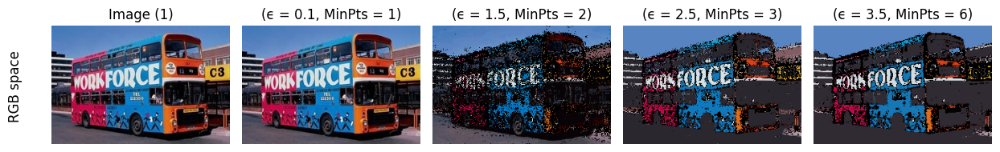

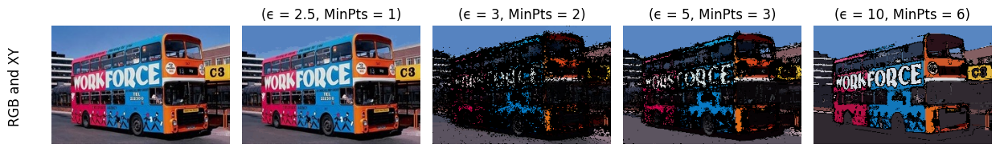

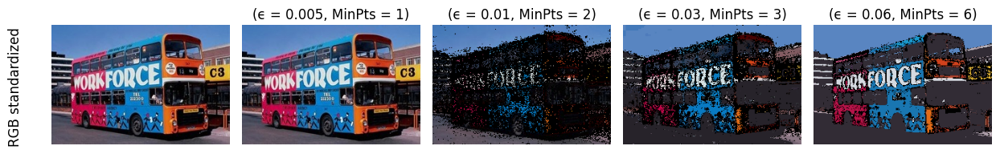

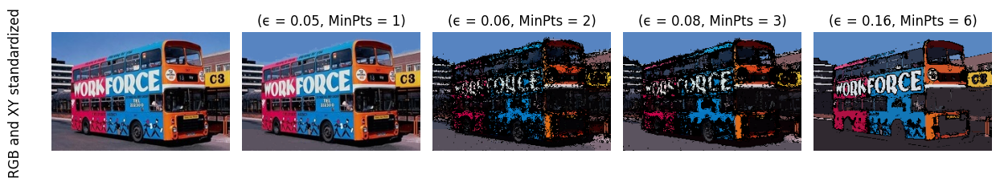

                                          Qualitative assessment on Image 1                                        
┏━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┳━━━━━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━
┃        Scenario         ┃   ϵ   ┃ MinPts ┃ Silhouette Score ┃ DB Index ┃       CH Index        ┃ Clusters ┃ Noise
┡━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━╇━━━━━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━
│        RGB space        │  0.1  │   1    │      0.467       │   0.0    │          1.0          │  27896   │   0  
│        RGB space        │  1.5  │   2    │      -0.292      │   1.52   │        17.512         │   4043   │ 16715
│        RGB space        │  2.5  │   3    │      -0.527      │  1.487   │         85.06         │   1153   │ 9359 
│        RGB space        │  3.5  │   6    │      -0.469      │  1.364   │        345.581        │   241    │ 10216
│       RGB and XY        │  2.5  │   1    │      -0.045      │  0.312   │        42.952         │  29895   │   0  
│       RGB and XY        │  3.0  │   2    │      -0.522      │  1.047   │        10.933         │   3150   │ 23999
│       RGB and XY        │  5.0  │   3    │      -0.532      │  1.112   │        34.397         │   1461   │ 18248
│       RGB and XY        │ 10.0  │   6    │      -0.432      │  1.392   │        244.972        │   290    │ 8888 
│    RGB standardized     │ 0.005 │   1    │      0.467       │   0.0    │ 1.5887825362908756e+… │  27896   │   0  
│    RGB standardized     │ 0.01  │   2    │      -0.04       │  1.708   │         7.266         │   4556   │ 23340
│    RGB standardized     │ 0.03  │   3    │      -0.615      │  1.679   │        46.812         │   1296   │ 15250
│    RGB standardized     │ 0.06  │   6    │      -0.395      │  1.355   │        454.963        │   211    │ 7601 
│ RGB and XY standardized │ 0.05  │   1    │      -0.105      │   0.45   │         17.11         │  26197   │   0  
│ RGB and XY standardized │ 0.06  │   2    │      -0.489      │  1.088   │        14.426         │   3461   │ 19212
│ RGB and XY standardized │ 0.08  │   3    │      -0.503      │  1.118   │        39.482         │   1486   │ 17567
│ RGB and XY standardized │ 0.16  │   6    │      -0.393      │  1.393   │        291.892        │   278    │ 8184 
└─────────────────────────┴───────┴────────┴──────────────────┴──────────┴───────────────────────┴──────────┴──────



Qualitative assessment on image 2


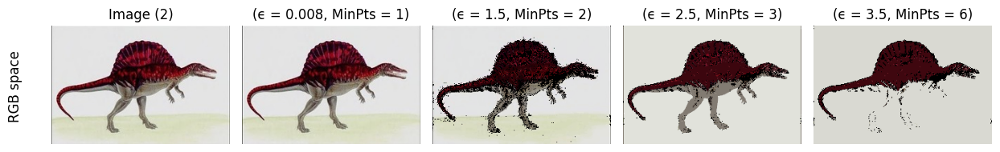

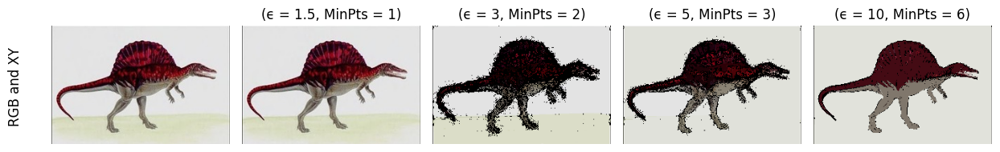

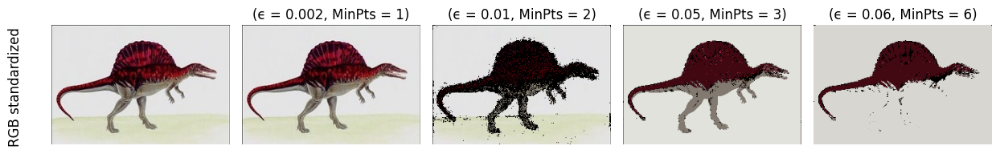

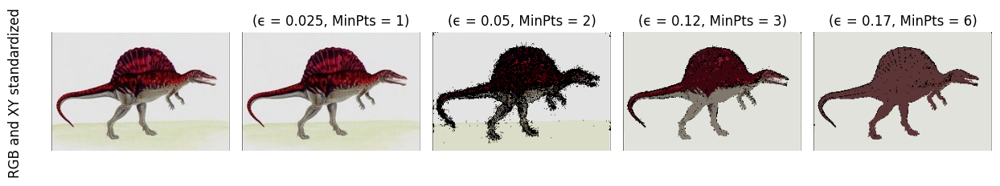

                                          Qualitative assessment on Image 2                                        
┏━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┳━━━━━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━
┃        Scenario         ┃   ϵ   ┃ MinPts ┃ Silhouette Score ┃ DB Index ┃       CH Index        ┃ Clusters ┃ Noise
┡━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━╇━━━━━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━
│        RGB space        │ 0.008 │   1    │      0.806       │   0.0    │          1.0          │  10782   │   0  
│        RGB space        │  1.5  │   2    │      0.225       │  1.464   │        205.415        │   1864   │ 5163 
│        RGB space        │  2.5  │   3    │      -0.122      │  1.826   │       2287.679        │   296    │ 2190 
│        RGB space        │  3.5  │   6    │      -0.261      │  1.836   │       3346.222        │    51    │ 2268 
│       RGB and XY        │  1.5  │   1    │      -0.098      │  0.333   │        240.611        │  20320   │   0  
│       RGB and XY        │  3.0  │   2    │      -0.68       │  1.524   │        42.065         │   1527   │ 9183 
│       RGB and XY        │  5.0  │   3    │      -0.602      │  1.434   │        92.801         │   701    │ 5831 
│       RGB and XY        │ 10.0  │   6    │      -0.451      │  1.451   │       1288.196        │    56    │ 1673 
│    RGB standardized     │ 0.002 │   1    │      0.806       │   0.0    │ 2.788449508979619e+27 │  10782   │   0  
│    RGB standardized     │ 0.01  │   2    │      0.619       │  1.035   │        75.504         │   2282   │ 8500 
│    RGB standardized     │ 0.05  │   3    │      -0.048      │   1.85   │       4282.589        │   178    │ 1224 
│    RGB standardized     │ 0.06  │   6    │      -0.348      │  2.724   │       4124.805        │    33    │ 1280 
│ RGB and XY standardized │ 0.025 │   1    │      -0.109      │  0.338   │        195.708        │  20261   │   0  
│ RGB and XY standardized │ 0.05  │   2    │      -0.657      │  1.416   │         47.09         │   1586   │ 8431 
│ RGB and XY standardized │ 0.12  │   3    │      -0.597      │  1.404   │        212.986        │   297    │ 1738 
│ RGB and XY standardized │ 0.17  │   6    │      -0.455      │   1.72   │       1516.111        │    33    │ 1067 
└─────────────────────────┴───────┴────────┴──────────────────┴──────────┴───────────────────────┴──────────┴──────



Qualitative assessment on image 3


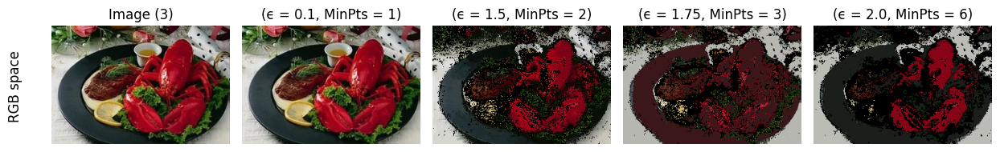

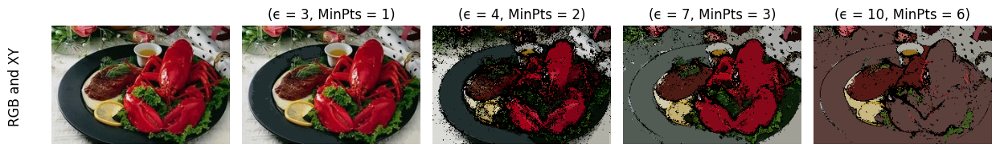

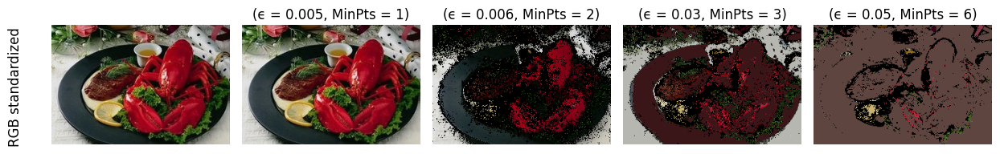

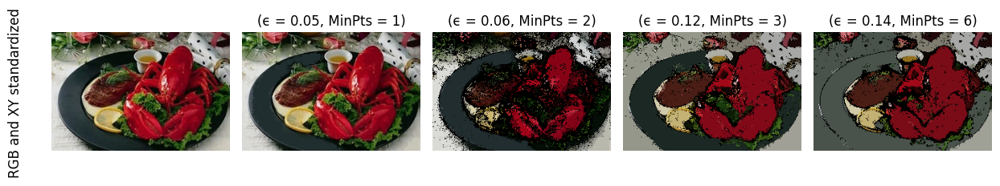

                                          Qualitative assessment on Image 3                                        
┏━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┳━━━━━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━
┃        Scenario         ┃   ϵ   ┃ MinPts ┃ Silhouette Score ┃ DB Index ┃       CH Index        ┃ Clusters ┃ Noise
┡━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━╇━━━━━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━
│        RGB space        │  0.1  │   1    │      0.469       │   0.0    │          1.0          │  29100   │   0  
│        RGB space        │  1.5  │   2    │      -0.243      │  1.244   │        24.255         │   5073   │ 14697
│        RGB space        │ 1.75  │   3    │      -0.67       │  1.739   │        56.635         │   1422   │ 13012
│        RGB space        │  2.0  │   6    │      -0.714      │  1.548   │        196.694        │   394    │ 18962
│       RGB and XY        │  3.0  │   1    │      -0.044      │   0.49   │        25.937         │  28931   │   0  
│       RGB and XY        │  4.0  │   2    │      -0.417      │  1.085   │        19.332         │   4127   │ 17437
│       RGB and XY        │  7.0  │   3    │      -0.519      │  1.359   │        39.289         │   1200   │ 8683 
│       RGB and XY        │ 10.0  │   6    │      -0.625      │  1.555   │        64.726         │   201    │ 6225 
│    RGB standardized     │ 0.005 │   1    │      0.469       │   0.0    │ 2.9577670243127926e+… │  29100   │   0  
│    RGB standardized     │ 0.006 │   2    │      -0.037      │  0.984   │         9.654         │   5847   │ 23253
│    RGB standardized     │ 0.03  │   3    │      -0.674      │  1.737   │        59.154         │   1404   │ 12593
│    RGB standardized     │ 0.05  │   6    │      -0.774      │  2.065   │        17.347         │   154    │ 7435 
│ RGB and XY standardized │ 0.05  │   1    │      -0.047      │  0.539   │        21.546         │  27965   │   0  
│ RGB and XY standardized │ 0.06  │   2    │      -0.438      │  1.083   │        16.206         │   4149   │ 18760
│ RGB and XY standardized │ 0.12  │   3    │      -0.513      │  1.434   │        70.301         │   993    │ 6715 
│ RGB and XY standardized │ 0.14  │   6    │      -0.536      │  1.424   │        108.429        │   282    │ 8668 
└─────────────────────────┴───────┴────────┴──────────────────┴──────────┴───────────────────────┴──────────┴──────



Qualitative assessment on image 4


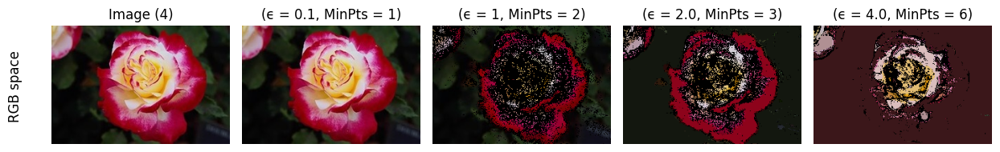

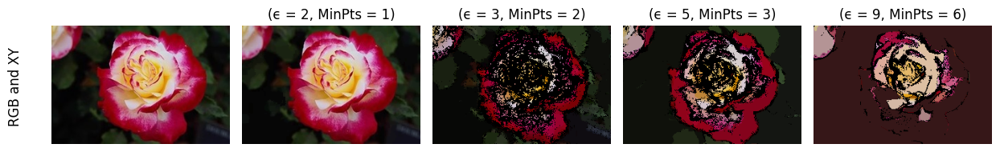

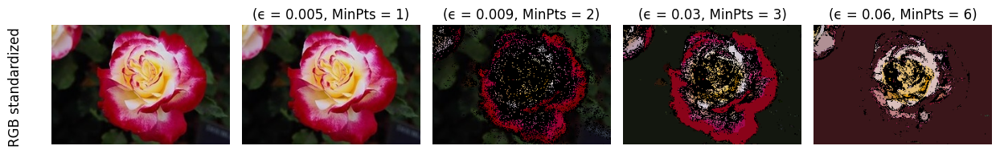

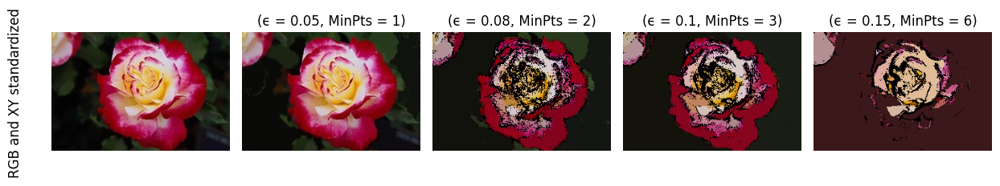

                                          Qualitative assessment on Image 4                                        
┏━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┳━━━━━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━
┃        Scenario         ┃   ϵ   ┃ MinPts ┃ Silhouette Score ┃ DB Index ┃       CH Index        ┃ Clusters ┃ Noise
┡━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━╇━━━━━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━
│        RGB space        │  0.1  │   1    │      0.563       │   0.0    │          1.0          │  24060   │   0  
│        RGB space        │  1.0  │   2    │      0.133       │  0.838   │        15.694         │   4728   │ 16806
│        RGB space        │  2.0  │   3    │      -0.642      │  1.333   │        140.072        │   1052   │ 12011
│        RGB space        │  4.0  │   6    │      -0.534      │  2.061   │        493.301        │   150    │ 5816 
│       RGB and XY        │  2.0  │   1    │      -0.03       │   0.26   │        130.164        │  27755   │   0  
│       RGB and XY        │  3.0  │   2    │      -0.452      │  1.005   │        28.041         │   3049   │ 16789
│       RGB and XY        │  5.0  │   3    │      -0.507      │  1.153   │        126.952        │   1063   │ 10813
│       RGB and XY        │  9.0  │   6    │      -0.565      │  1.329   │        203.008        │   183    │ 5304 
│    RGB standardized     │ 0.005 │   1    │      0.563       │   0.0    │ 3.138734755386862e+29 │  24060   │   0  
│    RGB standardized     │ 0.009 │   2    │      0.147       │   0.86   │         9.557         │   4929   │ 19131
│    RGB standardized     │ 0.03  │   3    │      -0.603      │  1.329   │        131.958        │   1033   │ 11313
│    RGB standardized     │ 0.06  │   6    │      -0.568      │  2.069   │        588.957        │   148    │ 5766 
│ RGB and XY standardized │ 0.05  │   1    │      -0.213      │  0.395   │        39.499         │  18650   │   0  
│ RGB and XY standardized │ 0.08  │   2    │      -0.478      │  1.157   │        54.459         │   2388   │ 7522 
│ RGB and XY standardized │  0.1  │   3    │      -0.517      │  1.265   │        126.369        │   906    │ 6252 
│ RGB and XY standardized │ 0.15  │   6    │      -0.516      │  1.354   │        238.45         │   141    │ 4150 
└─────────────────────────┴───────┴────────┴──────────────────┴──────────┴───────────────────────┴──────────┴──────

In [ ]:
silhouette_scores_avg = []
db_scores_avg = []
ch_scores_avg = []
titles = ['RGB space', 'RGB and XY', 'RGB standardized', 'RGB and XY standardized']

for j, image in enumerate(images):
    image_reshaped = rgb_feature_space(image)
    image_reshaped_with_indices = rgb_xy_feature_space(image)
    scaler_rgb, standardized_img_rgb = standardize_rgb_features(image)
    scaler_rgb_xy, standardized_img_rgb_xy = standardize_rgb_xy_features(image)

    height, width, n_channels = image.shape

    segmented_images = [[] for _ in range(n_tasks)]
    silhouette_scores = [[] for _ in range(n_tasks)]
    db_scores = [[] for _ in range(n_tasks)]
    n_clusters_list = [[] for _ in range(n_tasks)]
    n_noise_list = [[] for _ in range(n_tasks)]
    ch_scores = [[] for _ in range(n_tasks)]

    print(f"Qualitative assessment on image {j + 1}")

    for i in range(len(eps_list[j])//4):
        segmented_image, labels, n_clusters_, n_noise_ = dbscan_rgb(eps_list[j][i],
                                                              min_samples[j][i],
                                                              image_reshaped,
                                                              image)
        segmented_images[0].append(segmented_image)
        silhouette = silhouette_score(image_reshaped, labels)
        db_score = davies_bouldin_score(image_reshaped, labels)
        ch_score = calinski_harabasz_score(image_reshaped, labels)
        silhouette_scores[0].append(silhouette)
        db_scores[0].append(db_score)
        ch_scores[0].append(ch_score)
        n_clusters_list[0].append(n_clusters_)
        n_noise_list[0].append(n_noise_)

        segmented_image, labels, n_clusters_, n_noise_ = dbscan_rgb_xy(eps_list[j][i+4],
                                                              min_samples[j][i+4],
                                                              image_reshaped_with_indices,
                                                              image)

        segmented_images[1].append(segmented_image)
        silhouette = silhouette_score(image_reshaped_with_indices, labels)
        db_score = davies_bouldin_score(image_reshaped_with_indices, labels)
        ch_score = calinski_harabasz_score(image_reshaped_with_indices, labels)
        silhouette_scores[1].append(silhouette)
        db_scores[1].append(db_score)
        ch_scores[1].append(ch_score)
        n_clusters_list[1].append(n_clusters_)
        n_noise_list[1].append(n_noise_)

        segmented_image, labels, n_clusters_, n_noise_ = dbscan_rgb_standardized(
                                                              eps_list[j][i+8],
                                                              min_samples[j][i+8],
                                                              standardized_img_rgb,
                                                              image, scaler_rgb)

        segmented_images[2].append(segmented_image)
        silhouette = silhouette_score(standardized_img_rgb, labels)
        db_score = davies_bouldin_score(standardized_img_rgb, labels)
        ch_score = calinski_harabasz_score(standardized_img_rgb, labels)
        silhouette_scores[2].append(silhouette)
        db_scores[2].append(db_score)
        ch_scores[2].append(ch_score)
        n_clusters_list[2].append(n_clusters_)
        n_noise_list[2].append(n_noise_)

        segmented_image, labels, n_clusters_, n_noise_ = dbscan_rgb_xy_standardized(
                                                              eps_list[j][i+12],
                                                              min_samples[j][i+12],
                                                              standardized_img_rgb_xy,
                                                              image, scaler_rgb_xy)

        segmented_images[3].append(segmented_image)
        silhouette = silhouette_score(standardized_img_rgb_xy, labels)
        db_score = davies_bouldin_score(standardized_img_rgb_xy, labels)
        ch_score = calinski_harabasz_score(standardized_img_rgb_xy, labels)
        silhouette_scores[3].append(silhouette)
        db_scores[3].append(db_score)
        ch_scores[3].append(ch_score)
        n_clusters_list[3].append(n_clusters_)
        n_noise_list[3].append(n_noise_)

    for t in range(n_tasks):
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 5, 1)
        plt.imshow(image)
        if t == 0:
            plt.title(f'Image ({j + 1})')
        plt.axis('off')

        # Get the position of the first subplot
        pos = plt.gca().get_position()

        # Add a rotated title beside 'Image (1)' using figure coordinates
        plt.figtext(pos.x0 - 0.15, pos.y0 + pos.height / 2, titles[t],
                ha='center', va='center', rotation=90, fontsize=12)
        indx = 0
        for i in range(t*4, t*4 + 4):
            plt.subplot(1, 5, indx + 2)
            plt.imshow(segmented_images[t][indx].astype(np.uint8))
            plt.title(f'(ϵ = {eps_list[j][i]}, MinPts = {min_samples[j][i]})')
            plt.axis('off')
            indx += 1
        plt.tight_layout()
        plt.show()

    print("\n")

    all_titles = [item for item in titles for _ in range(4)]

    silhouette_scores_list = np.array(silhouette_scores).flatten().tolist()
    db_scores_list = np.array(db_scores).flatten().tolist()
    ch_scores_list = np.array(ch_scores).flatten().tolist()
    clusters_list = np.array(n_clusters_list).flatten().tolist()
    noise_list = np.array(n_noise_list).flatten().tolist()

    silhouette_scores_avg.append(silhouette_scores_list)
    db_scores_avg.append(db_scores_list)
    ch_scores_avg.append(ch_scores_list)

    formatted_silhouette = [round(num, 3) for num in silhouette_scores_list]
    formatted_db = [round(num, 3) for num in db_scores_list]
    formatted_ch = [round(num, 3) for num in ch_scores_list]

    data = {
        "Scenario": all_titles,
        "ϵ": eps_list[j],
        "MinPts": min_samples[j],
        "Silhouette Score": formatted_silhouette,
        "DB Index": formatted_db,
        "CH Index": formatted_ch,
        "Clusters": clusters_list,
        "Noise": noise_list
    }

    df = pd.DataFrame(data)
    title = str("Qualitative assessment on Image ") + str(j + 1)
    table = Table(title=title)
    table.add_column("Scenario", justify="center", min_width=23)
    table.add_column("ϵ", justify="center")
    table.add_column("MinPts", justify="center")
    table.add_column("Silhouette Score", justify="center")
    table.add_column("DB Index", justify="center")
    table.add_column("CH Index", justify="center")
    table.add_column("Clusters", justify="center")
    table.add_column("Noise", justify="center")

    # Add rows to the table from the DataFrame
    for _, row in df.iterrows():
        table.add_row(
            row["Scenario"],
            str(row["ϵ"]),
            str(row["MinPts"]),
            str(row["Silhouette Score"]),
            str(row["DB Index"]),
            str(row["CH Index"]),
            str(row["Clusters"]),
            str(row["Noise"])
        )

    # Print the table using rich Console
    console = Console()
    console.print(table)

    print('\n')

#### **Results summarization code**

In [ ]:
all_titles = [item for item in titles for _ in range(4)]

silhouette_avg = np.mean(silhouette_scores_avg, axis=0)
db_avg = np.mean(db_scores_avg, axis=0)
ch_avg = np.mean(ch_scores_avg, axis=0)
eps_avg = np.mean(eps_list, axis=0)
minPts_avg = np.mean(min_samples, axis=0)
formatted_silhouette = [round(num, 3) for num in silhouette_avg]
formatted_db = [round(num, 3) for num in db_avg]
formatted_ch = [round(num, 3) for num in ch_avg]
formatted_eps = [round(num, 3) for num in eps_avg]

data = {
    "Scenario": all_titles,
    "ϵ": formatted_eps,
    "MinPts": minPts_avg,
    "Silhouette Score": formatted_silhouette,
    "DB Index": formatted_db,
    "CH Index": formatted_ch
}

df = pd.DataFrame(data)
table = Table(title="DBSCAN results summary")
table.add_column("Scenario", justify="center")
table.add_column("ϵ", justify="center")
table.add_column("MinPts", justify="center")
table.add_column("Silhouette Score", justify="center")
table.add_column("DB Index", justify="center")
table.add_column("CH Index", justify="center")

# Add rows to the table from the DataFrame
for _, row in df.iterrows():
    table.add_row(
        row["Scenario"],
        str(row["ϵ"]),
        str(row["MinPts"]),
        str(row["Silhouette Score"]),
        str(row["DB Index"]),
        str(row["CH Index"]),
    )

#### **DBSCAN summary and analysis**

In [ ]:
console = Console()
console.print(table)

print('\n')

                                      DBSCAN results summary                                       
┏━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┳━━━━━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Scenario         ┃   ϵ   ┃ MinPts ┃ Silhouette Score ┃ DB Index ┃        CH Index        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━╇━━━━━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│        RGB space        │ 0.077 │  1.0   │      0.576       │   0.0    │          1.0           │
│        RGB space        │ 1.375 │  2.0   │      -0.044      │  1.266   │         65.719         │
│        RGB space        │ 2.188 │  3.0   │      -0.49       │  1.596   │        642.362         │
│        RGB space        │ 3.25  │  6.0   │      -0.494      │  1.702   │        1095.449        │
│       RGB and XY        │ 2.25  │  1.0   │      -0.054      │  0.349   │        109.916         │
│       RGB and XY        │ 3.25  │  2.0   │      -0.518      │  1.165   │         25.093         │
│       RGB and XY        │  5.5  │  3.0   │      -0.54       │  1.265   │         73.36          │
│       RGB and XY        │ 9.75  │  6.0   │      -0.518      │  1.432   │        450.226         │
│    RGB standardized     │ 0.004 │  1.0   │      0.576       │   0.0    │ 1.1445539382771086e+31 │
│    RGB standardized     │ 0.009 │  2.0   │      0.172       │  1.147   │         25.495         │
│    RGB standardized     │ 0.035 │  3.0   │      -0.485      │  1.649   │        1130.128        │
│    RGB standardized     │ 0.057 │  6.0   │      -0.521      │  2.053   │        1296.518        │
│ RGB and XY standardized │ 0.044 │  1.0   │      -0.118      │   0.43   │         68.466         │
│ RGB and XY standardized │ 0.062 │  2.0   │      -0.515      │  1.186   │         33.045         │
│ RGB and XY standardized │ 0.105 │  3.0   │      -0.533      │  1.305   │        112.285         │
│ RGB and XY standardized │ 0.155 │  6.0   │      -0.475      │  1.473   │         538.72         │
└─────────────────────────┴───────┴────────┴──────────────────┴──────────┴────────────────────────┘

**Comment**: depending on my images & results & [ϵ, MinPts] values
* Good performance on optimal (nearly) values of ϵ and MinPts.
* As long as both parameters increase, DBSCAN fails to catch the original details, it is clear that some pixels are considered noise (black points on the images).
* When increasing both parameters for some values, we notice the noise decreases/disappears but the segmentation quality still bad.
* Good segmentation on the four scenarios.

---

**Qualitative analysis**: for all scenarios
 * The first image is the best one that matches the original image.
 * Second image is filled with noise (black points).
 * As hyperparameters increase, the noise disappears and the image gets some of its original colors.

**What do we notice?**
* DBSCAN works good, but it requires intensive search for optimal values of hyperparameters, DBSCAN is very sensitive to them.
* In terms of hyperparameters selection, K-means is simple and doesn't require much time in tuning the K value.

---

# **Conclusion**

This table summarizes the results of three models (K-means, GMM, DBSCAN) on their best paramters values.

| Model                      | Scenario                   | Silhouette Score | DB Index | CH Index         |
|----------------------------|----------------------------|-------------------|----------|------------------|
| K-means                     | RGB space                   | 0.391             | 0.914    | 380379.625       |
| GMM                        | RGB space                   | 0.138             | 1.79     | 142263.678       |
| DBSCAN                     | RGB space                   | 0.576             | 0.0      | 1.0              |
| K-means                     | RGB and XY                  | 0.327             | 1.002    | 51437.361        |
| GMM                        | RGB and XY                  | 0.063             | 1.798    | 17617.313        |
| DBSCAN                     | RGB and XY                  | -0.054            | 0.349    | 109.916          |
| K-means                     | RGB standardized            | 0.368             | 0.918    | 366049.565       |
| GMM                        | RGB standardized            | 0.143             | 1.67     | 139676.915       |
| DBSCAN                     | RGB standardized            | 0.576             | 0.0      | 1.1445539382771086e+31 |
| K-means                     | RGB and XY standardized     | 0.324             | 0.997    | 51954.062        |
| GMM                        | RGB and XY standardized     | 0.089             | 1.779    | 17737.322        |
| DBSCAN                     | RGB and XY standardized     | -0.118            | 0.43     | 68.466           |


**Based on quantitative analysis:**
 * In all scenarios, K-means tends to outperform GMM and DBSCAN based on Silhouette Score and Calinski-Harabasz Index.
 * DBSCAN performs exceptionally well in RGB space based on silhouette score and DBI, indicating clear density-based clusters.
 * GMM generally exhibits lower Silhouette Scores and CH Index compared to K-means.
 * RGB features seem to outperform RGB&XY in most cases, suggesting color is the primary driver for segmentation in this situation.
 * Standardizing RGB features slightly improves KMeans performance in some scenarios.

**Based on qualitative analysis:**
 * All models on all sccenarios worked perfectly and segmented all images correctly, except GMM with RGB + XY features didn't segment the images correctly.